<a href="https://colab.research.google.com/github/thepbordin/Obstacle-Detection-for-Blind-people/blob/main/Detectron2_with_my_datasets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Detectron 2, torch.

In [ ]:
!python -m pip install pyyaml==5.1
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'


exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 7.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=79caccf7b61bc955d1cad72934b522709a6656bae67be5162faeb44d0f0381a1
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-rk9uuyn_
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-rk9uuyn_
     |████████████████████████████████| 50 kB 4.3 MB/s 
     |████████████████████████████████| 79 kB 

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
torch:  1.11 ; cuda:  cu113
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Download and Extract Datasets file

## From Kaggle

In [ ]:
! mkdir -p ~/.kaggle
! cp "/content/drive/MyDrive/AI Builders/kaggle.json" ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#Kaggle Download
!pip install kaggle
!kaggle datasets download -d thepbordin/door-and-path-object-detection-dataset

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
 91% 122M/135M [00:03<00:00, 49.1MB/s]
100% 135M/135M [00:03<00:00, 42.2MB/s]


## From Google Drive

In [ ]:
# import shutil
# shutil.rmtree('/content/data')

### Dataset 3.0 img and cocoFormat

In [ ]:
#Extract 
!mkdir -p ./data
!unzip "/content/drive/Shareddrives/AI Builders/dataset 3.0.zip" -d "data/"
!cp "/content/drive/Shareddrives/AI Builders/DatasetDetectron2/test.json" "data/"
!cp -av "/content/drive/Shareddrives/AI Builders/DatasetDetectron2/test_img" "data/test_img"

!cp "/content/drive/Shareddrives/AI Builders/DatasetDetectron2/test.json" "data/"
!cp "/content/drive/Shareddrives/AI Builders/DatasetDetectron2/train.json" "data/"

Archive:  /content/drive/Shareddrives/AI Builders/dataset 3.0.zip
 extracting: data/annotations/instances_default.json  
 extracting: data/images/c777987787fa1284.jpg  
 extracting: data/images/2bedf10fd4f91cb5.jpg  
 extracting: data/images/383b3d43f4b1e55a.jpg  
 extracting: data/images/737b6903c9a4234d.jpg  
 extracting: data/images/c0dae2792f4a2b7e.jpg  
 extracting: data/images/daa62fa745f83a8e.jpg  
 extracting: data/images/2bbb8c43a3380316.jpg  
 extracting: data/images/70b557082dfe6b98.jpg  
 extracting: data/images/5f9cbca55c53abfb.jpg  
 extracting: data/images/868.png     
 extracting: data/images/023b447cac3b3557.jpg  
 extracting: data/images/a12ad8a06226a6dd.jpg  
 extracting: data/images/d157cbf8d7f3c78a.jpg  
 extracting: data/images/90e23144d905d72a.jpg  
 extracting: data/images/0001cb734adac2ee.jpg  
 extracting: data/images/26e5dff94b5672cc.jpg  
 extracting: data/images/b11dc1515c647e32.jpg  
 extracting: data/images/0f3e5d607d82e4e9.jpg  
 extracting: data/images/

In [ ]:
import glob
print(f"{len(glob.glob('./data/*/*.jpg'))} files")

1168 files


#Register COCO Dataset

In [ ]:
rootdir = "/content/data"
modelsave_dir = "/content/drive/Shareddrives/AI Builders/Model Checkpoints/Baseline model"

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, os.path.join(rootdir, "train.json"), "./data/images")
register_coco_instances("my_dataset_val", {}, os.path.join(rootdir, "test.json"), "/content/data/test_img")


In [ ]:
data_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train") 

dataset_val_dict = DatasetCatalog.get("my_dataset_val") 

[06/16 08:29:22 d2.data.datasets.coco]: Loaded 1242 images in COCO format from /content/data/train.json
[06/16 08:29:22 d2.data.datasets.coco]: Loaded 106 images in COCO format from /content/data/test.json


# Show Random Data with annotation

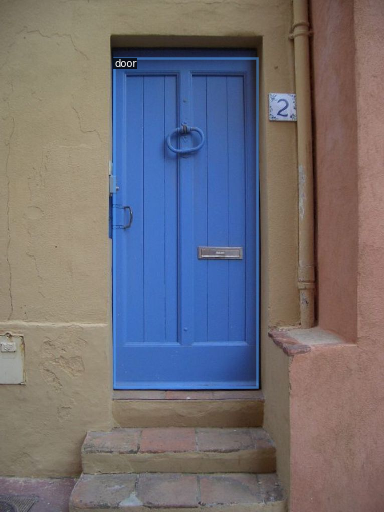

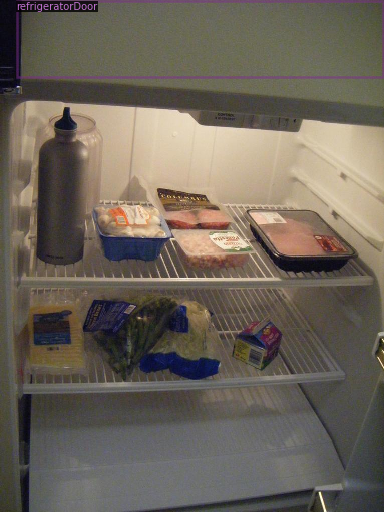

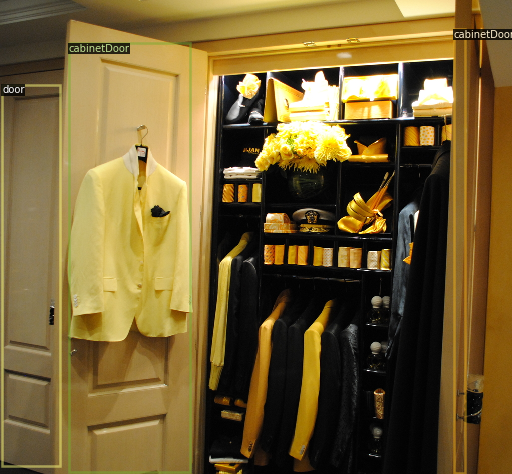

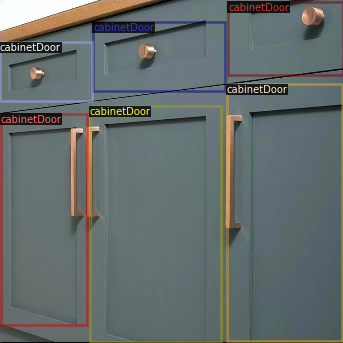

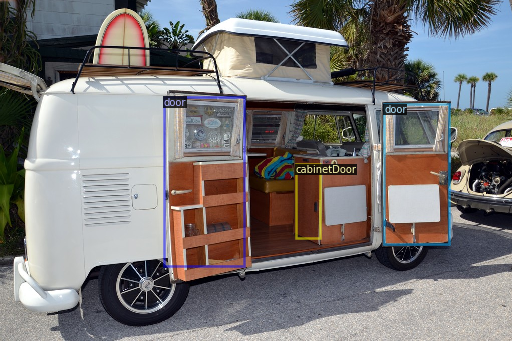

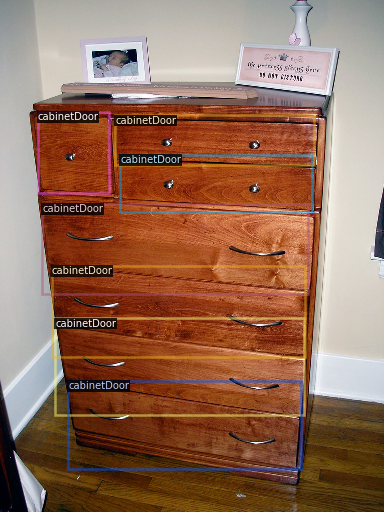

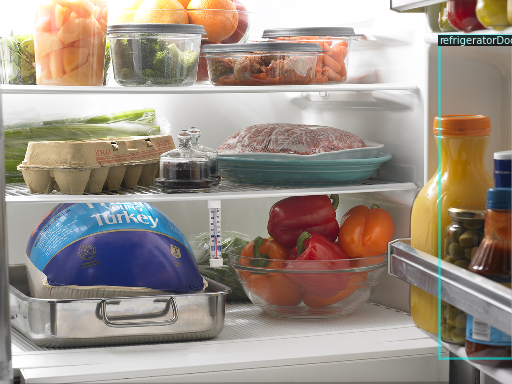

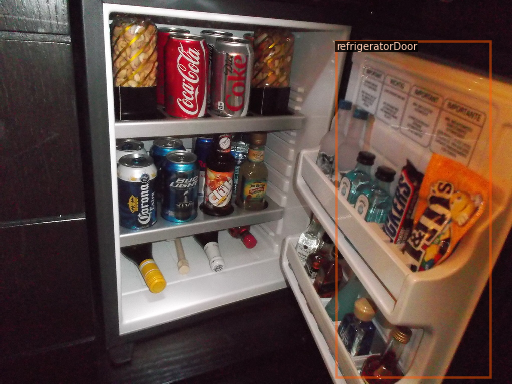

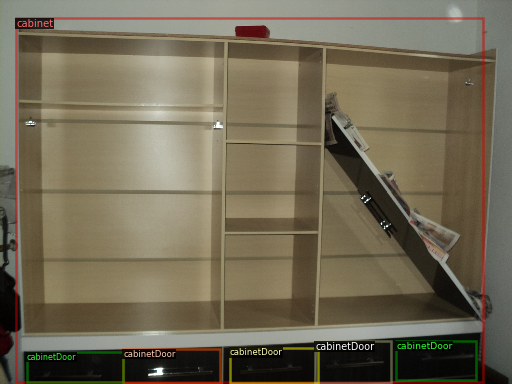

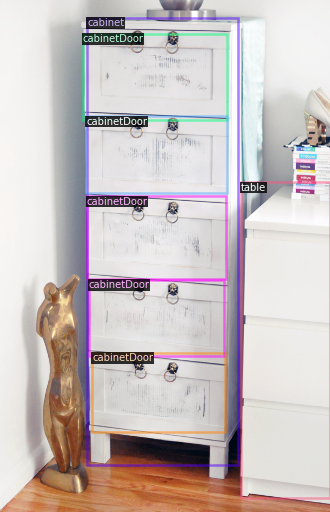

In [ ]:
import random
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=data_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Setup Wandb

In [ ]:
!pip install wandb
!wandb login

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 15.2 MB/s 
     |████████████████████████████████| 145 kB 75.8 MB/s 
     |████████████████████████████████| 181 kB 77.0 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=85fe76920651ca2465b4c33d3af51403c0da38d893f626dab7928720776b3914
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: ERROR API key must be 40 characters long, yours was 41
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+

In [ ]:
import wandb
wandb.init(project="Original_DoorDetect Dataset", entity="thepbordinteam")

wandb: Currently logged in as: thepbordin (thepbordinteam). Use `wandb login --relogin` to force relogin


# Load Model from Modelzoo and Train!


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train", )
cfg.DATASETS.TEST = ()
cfg.TEST.EVAL_PERIOD = True
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 5
cfg.SOLVER.BASE_LR = 0.0003  # pick a good LR
# cfg.SOLVER.MAX_ITER = round((len(dataset_dicts)/cfg.SOLVER.IMS_PER_BATCH)*20)     
cfg.SOLVER.MAX_ITER = 10000   
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
cfg.OUTPUT_DIR = modelsave_dir
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# wandb.config = {
#   "learning_rate": cfg.SOLVER.BASE_LR,
#   "epochs": cfg.SOLVER.MAX_ITER/250,
#   "batch_size": cfg.SOLVER.IMS_PER_BATCH
# }

In [ ]:
# from detectron2.engine import HookBase

# class HelloHook(HookBase):
#   def after_step(self):
#     if self.trainer.iter % 250 == 0:
#       wandb.log({"loss": self.#total_loss})

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/15 18:07:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:10, 15.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (11, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (11,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (40, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (40,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box

[06/15 18:07:55 d2.engine.train_loop]: Starting training from iteration 0
[06/15 18:08:13 d2.utils.events]:  eta: 2:14:14  iter: 19  total_loss: 3.149  loss_cls: 2.374  loss_box_reg: 0.1349  loss_rpn_cls: 0.5613  loss_rpn_loc: 0.07874  time: 0.8882  data_time: 0.2131  lr: 5.9943e-06  max_mem: 5973M
[06/15 18:08:33 d2.utils.events]:  eta: 2:19:07  iter: 39  total_loss: 2.917  loss_cls: 2.188  loss_box_reg: 0.1117  loss_rpn_cls: 0.5228  loss_rpn_loc: 0.0762  time: 0.9183  data_time: 0.2076  lr: 1.1988e-05  max_mem: 6238M
[06/15 18:08:50 d2.utils.events]:  eta: 2:20:39  iter: 59  total_loss: 2.557  loss_cls: 1.797  loss_box_reg: 0.1576  loss_rpn_cls: 0.4486  loss_rpn_loc: 0.08318  time: 0.9050  data_time: 0.1568  lr: 1.7982e-05  max_mem: 6238M
[06/15 18:09:08 d2.utils.events]:  eta: 2:19:31  iter: 79  total_loss: 1.938  loss_cls: 1.301  loss_box_reg: 0.1351  loss_rpn_cls: 0.4495  loss_rpn_loc: 0.09873  time: 0.8985  data_time: 0.1877  lr: 2.3976e-05  max_mem: 6238M
[06/15 18:09:25 d2.util

# Show result with TensorBoard

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/Shareddrives/AI Builders/Model Checkpoints/"

# Define Predictor Class

In [ ]:
from detectron2.engine import DefaultTrainer

# cfg = get_cfg()
# cfg.OUTPUT_DIR = "/content/drive/MyDrive/AI Builders/Model Checkpoints"
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0009999.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4
predictor = DefaultPredictor(cfg)

[06/16 08:30:30 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

# Show Prediction in validation set

/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


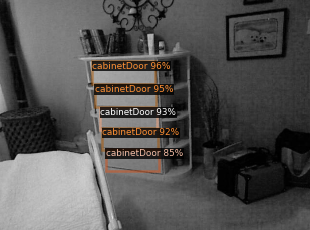

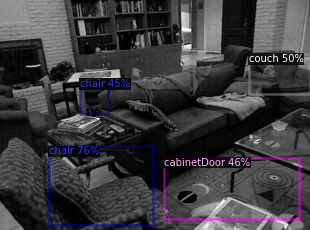

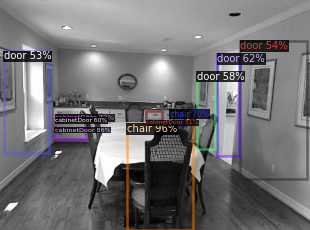

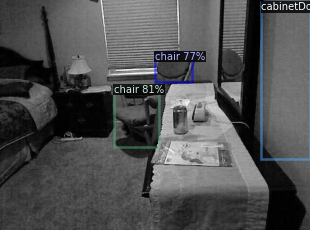

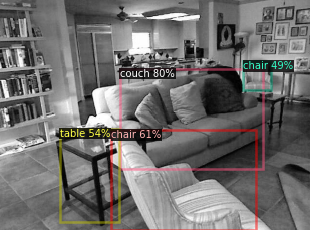

...

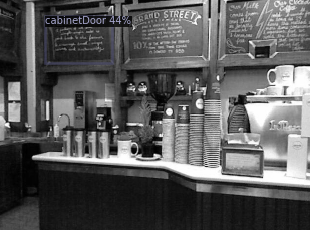

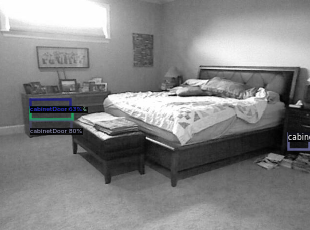

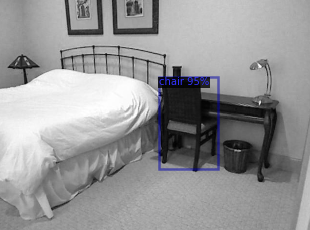

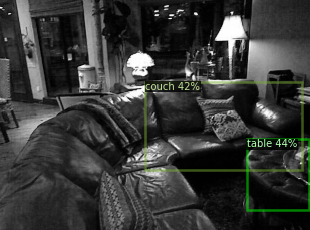

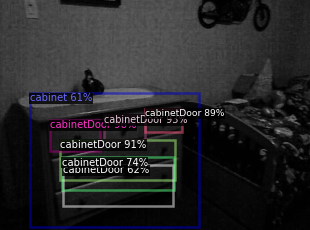

KeyboardInterrupt: ignored

In [ ]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(dataset_val_dict, len(dataset_val_dict)):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=data_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

# Evaluate Model


In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[06/16 08:30:58 d2.data.datasets.coco]: Loaded 106 images in COCO format from /content/data/test.json
[06/16 08:30:58 d2.data.build]: Distribution of instances among all 10 categories:
|  category  | #instances   |  category   | #instances   |   category    | #instances   |
|:----------:|:-------------|:-----------:|:-------------|:-------------:|:-------------|
|    door    | 35           | cabinetDoor | 183          | refrigerato.. | 2            |
|   window   | 63           |    chair    | 87           |     table     | 48           |
|  cabinet   | 53           |    couch    | 58           |  openedDoor   | 20           |
|    pole    | 8            |             |              |               |              |
|   total    | 557          |             |              |               |              |
[06/16 08:30:58 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/16